<center>
    <br>
    <br>
    <h5 style = "color:green">--------------------------------------------------------------------------------------------</h5>
    <h1 style = "color:blue">Image Processing Project</h1>
    <h5 style = "color:green">--------------------------------------------------------------------------------------------</h5>
    <br>
    <br>
<center>

# Function 1: (Rotate an Image)

Import the cv2 module<br>
Use the imread() method of the cv2 module, specify the path to the image in the arguments and store the image in a variable<br>
To rotate this image, you need the width and the height of the image because you will use them in the rotation process<br>
To get the rotation matrix, we use the getRotationMatrix2D() method of cv2<br>
To rotate the image, we have a cv2 method named wrapAffine which takes the original image, the rotation matrix of the image and the width and height of the image as arguments.

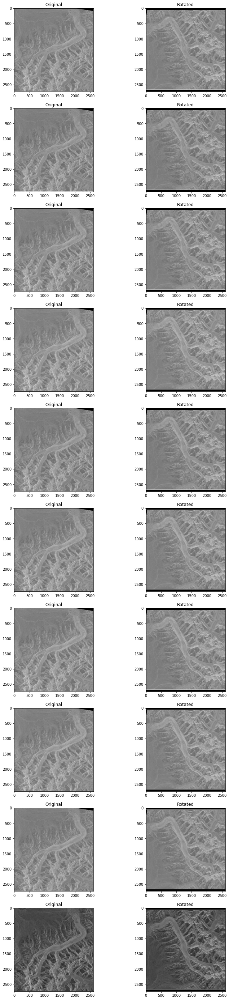

In [1]:
import cv2
import glob
from matplotlib import pyplot as plt

def rotate_image(img):
    height, width = img.shape[0:2]
    rotationMatrix = cv2.getRotationMatrix2D((width/2, height/2), 90, 1)
    rotatedImage = cv2.warpAffine(img, rotationMatrix, (width, height))
    return rotatedImage

f,ax=plt.subplots(len(glob.glob('images/*.png')),2,figsize=(12,50))
for i, filename in enumerate(glob.glob('images/*.png')):
    image = cv2.imread(filename)
    ax[i,0].imshow(image)
    ax[i,0].set_title('Original')
    image = rotate_image(image)
    ax[i,1].imshow(image)
    ax[i,1].set_title('Rotated')

# Function 2: (Crop an Image)

<br>We need to import the cv2 module and read the image and extract the width and height of the image
<br>Get the starting and ending index of the row and column. This will define the size of the newly created image. For example, start from row number 10 till row number 15 will give the height of the image.
<br>Similarly, start from column number 10 until column number 15 will give the width of the image
<br>You can get the starting point by specifying the percentage value of the total height and the total width. Similarly, to get the ending point of the cropped image, specify the percentage values
<br>Map these values to the original image. Note that you have to cast the starting and ending values to integers because when mapping, the indexes are always integers.

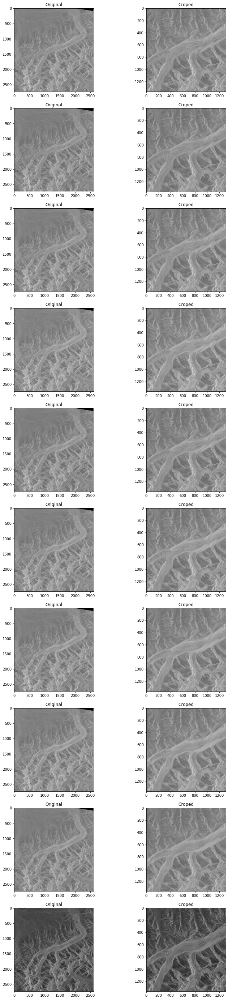

In [2]:
import cv2
import glob
from matplotlib import pyplot as plt

def crop_image(img):
    height, width = img.shape[0:2]
    startRow = int(height*.25)
    startCol = int(width*.25)
    endRow = int(height*.75)
    endCol = int(width*.75)
    croppedImage = img[startRow:endRow, startCol:endCol]
    return croppedImage

f,ax=plt.subplots(len(glob.glob('images/*.png')),2,figsize=(12,50))
for i, filename in enumerate(glob.glob('images/*.png')):
    image = cv2.imread(filename)
    ax[i,0].imshow(image)
    ax[i,0].set_title('Original')
    image = crop_image(image)
    ax[i,1].imshow(image)
    ax[i,1].set_title('Croped')

# Function 3: (Adjust Image Contrast)

<br>In Python OpenCV module, there is no particular function to adjust image contrast but the official documentation of OpenCV suggests an equation that can perform image brightness and image contrast both at the same time.
<br>Here a is alpha which defines contrast of the image. If a is greater than 1, there will be higher contrast.
<br>If the value of a is between 0 and 1 (smaller than 1 but greater than 0), there would be lower contrast. If a is 1, there will be no contrast effect on the image.
<br>b stands for beta. The values of b vary from -127 to +127.
<br>To implement this equation in Python OpenCV, you can use the addWeighted() method. We use The addWeighted() method as it generates the output in the range of 0 and 255 for a 24-bit color image.

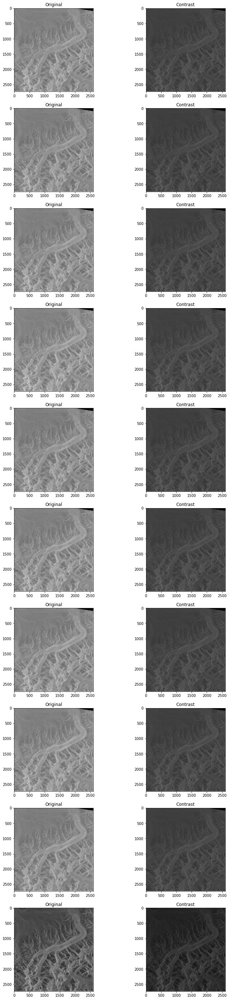

In [3]:
import cv2
import glob
import numpy as np
from matplotlib import pyplot as plt

def adjust_contrast(img):
    contrast_img = cv2.addWeighted(img, 0.5, np.zeros(img.shape, img.dtype), 0, 0)
    return contrast_img

f,ax=plt.subplots(len(glob.glob('images/*.png')),2,figsize=(12,50))
for i, filename in enumerate(glob.glob('images/*.png')):
    image = cv2.imread(filename)
    ax[i,0].imshow(image)
    ax[i,0].set_title('Original')
    image = adjust_contrast(image)
    ax[i,1].imshow(image)
    ax[i,1].set_title('Contrast')

# Function 4: (Blur an Image)

<br>To make an image blurry, you can use the GaussianBlur() method of OpenCV.
<br>The GaussianBlur() uses the Gaussian kernel. The height and width of the kernel should be a positive and an odd number.
<br>Then you have to specify the X and Y direction that is sigmaX and sigmaY respectively. If only one is specified, both are considered the same.

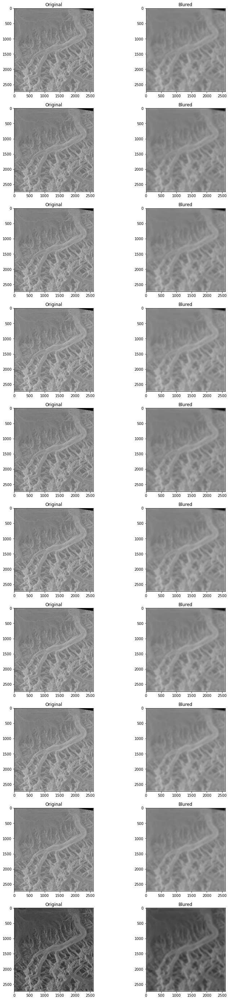

In [4]:
import cv2
import glob
import numpy as np
from matplotlib import pyplot as plt

def blur_img(img):
    blur_image = cv2.GaussianBlur(img, (127,127), 0)
    return blur_image

f,ax=plt.subplots(len(glob.glob('images/*.png')),2,figsize=(12,50))
for i, filename in enumerate(glob.glob('images/*.png')):
    image = cv2.imread(filename)
    ax[i,0].imshow(image)
    ax[i,0].set_title('Original')
    image = blur_img(image)
    ax[i,1].imshow(image)
    ax[i,1].set_title('Blured')

# Function 5: (Detect Edges)

To detect the edges in an image, you can use the Canny() method of cv2 which implements the Canny edge detector. The Canny edge detector is also known as the optimal detector.

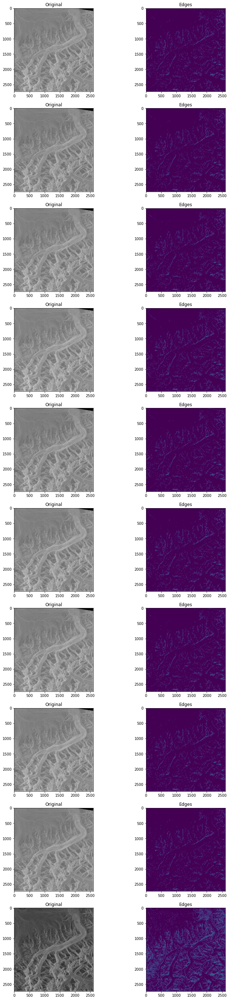

In [5]:
import cv2
import glob
import numpy as np
from matplotlib import pyplot as plt

def detect_edges(img):
    edge_img = cv2.Canny(img,100,200)
    return edge_img

f,ax=plt.subplots(len(glob.glob('images/*.png')),2,figsize=(12,50))
for i, filename in enumerate(glob.glob('images/*.png')):
    image = cv2.imread(filename)
    ax[i,0].imshow(image)
    ax[i,0].set_title('Original')
    image = detect_edges(image)
    ax[i,1].imshow(image)
    ax[i,1].set_title('Edges')

# Function 6: (Reduce Noise)

<br>To reduce noise from an image, OpenCV provides the following methods:
<br>fastNlMeansDenoising(): Removes noise from a grayscale image
<br>fastNlMeansDenoisingColored(): Removes noise from a colored image
<br>fastNlMeansDenoisingMulti(): Removes noise from grayscale image frames (a grayscale video)
<br>fastNlMeansDenoisingColoredMulti(): Same as 3 but works with colored frames  
<br>Apply the denoising function which takes respectively the original image (src), the destination (which we have kept none as we are storing the resultant), the filter strength, the image value to remove the colored noise (usually equal to filter strength or 10), the template patch size in pixel to compute weights which should always be odd (recommended size equals 7) and the window size in pixels to compute average of the given pixel.    

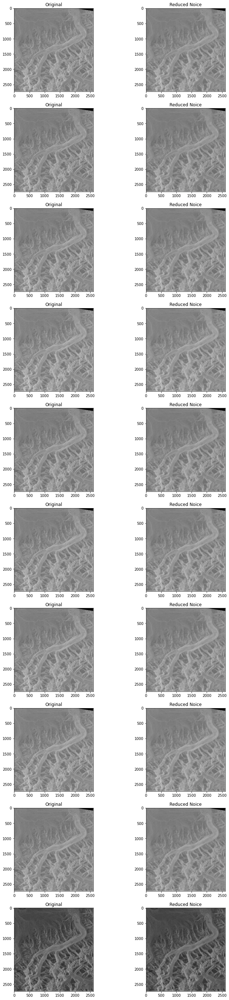

In [6]:
import cv2
import glob
import numpy as np
from matplotlib import pyplot as plt

def reduce_noice(img):
    reduce_noice = cv2.fastNlMeansDenoisingColored(img,None,20,10,7,21)
    return reduce_noice

f,ax=plt.subplots(len(glob.glob('images/*.png')),2,figsize=(12,50))
for i, filename in enumerate(glob.glob('images/*.png')):
    image = cv2.imread(filename)
    ax[i,0].imshow(image)
    ax[i,0].set_title('Original')
    image = reduce_noice(image)
    ax[i,1].imshow(image)
    ax[i,1].set_title('Reduced Noice')

# Function 7: (Get image contour)

<br>Contours are the curves in an image that are joint together. The curves join the continuous points in an image. The purpose of contours is used to detect the objects.
<br>Read the image and convert it to a grayscale image
<br>Find the threshold
<br>Use the findContours() which takes the image (we passed threshold here) and some attributes. See findContours() Official.
<br>Draw the contours on the image using drawContours() method
<br>Display the image

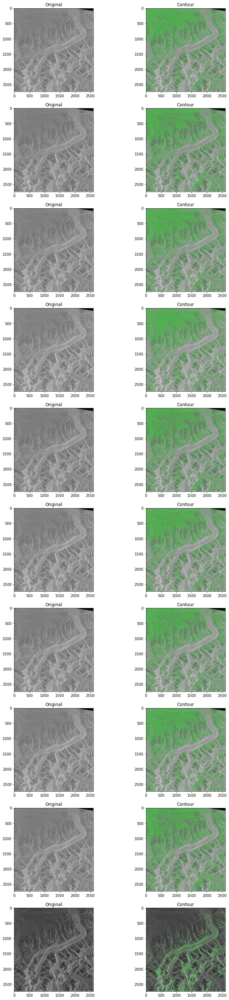

In [7]:
import cv2
import glob
import numpy as np
from matplotlib import pyplot as plt

def contour(img):
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    retval, thresh = cv2.threshold(gray_img, 127, 255, 0)
    img_contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(img, img_contours, -1, (0, 255, 0))
    return img

f,ax=plt.subplots(len(glob.glob('images/*.png')),2,figsize=(12,50))
for i, filename in enumerate(glob.glob('images/*.png')):
    image = cv2.imread(filename)
    ax[i,0].imshow(image)
    ax[i,0].set_title('Original')
    image = contour(image)
    ax[i,1].imshow(image)
    ax[i,1].set_title('Contour')

# Function 8: (Erosion)

This technique removes the boundary pixels from the input by just passing the filter on the image. Depending on the size of the kernel, it removes the boundary pixels from the input image. It performs similar to soil erosion so they named this technique as erosion.

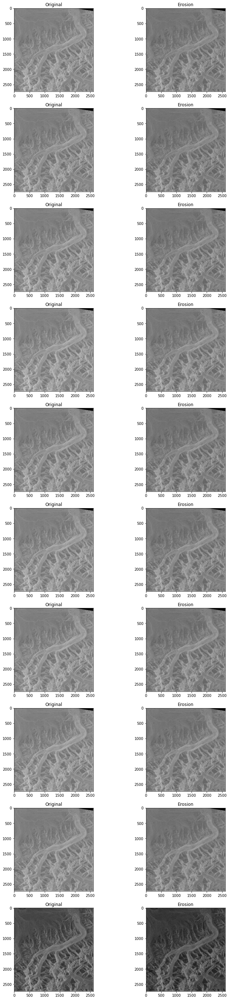

In [8]:
import cv2
import glob
import numpy as np
from matplotlib import pyplot as plt

def Erosion(img):
    kernel = np.ones((5,5),np.uint8)
    img_erosion = cv2.erode(img, kernel, iterations=1)
    return img_erosion

f,ax=plt.subplots(len(glob.glob('images/*.png')),2,figsize=(12,50))
for i, filename in enumerate(glob.glob('images/*.png')):
    image = cv2.imread(filename)
    ax[i,0].imshow(image)
    ax[i,0].set_title('Original')
    image = Erosion(image)
    ax[i,1].imshow(image)
    ax[i,1].set_title('Erosion')

# Function 9: (Dilation)

The above technique removes the boundary pixels but in Dilation. It adds the additional pixels to the input. It is used when the pixels are missing in the image. In general practices, we apply erosion to shrink the image to remove noises, and then by applying the dilation, there will be no loss of pixels.

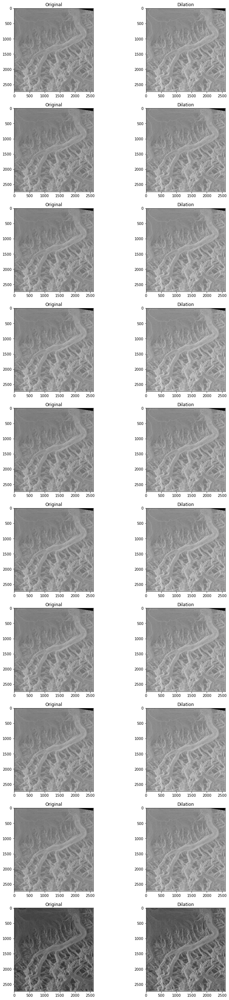

In [9]:
import cv2
import glob
import numpy as np
from matplotlib import pyplot as plt

def dilation(img):
    kernel = np.ones((5,5),np.uint8)
    img_dilation = cv2.dilate(img, kernel, iterations=1)
    return img_dilation

f,ax=plt.subplots(len(glob.glob('images/*.png')),2,figsize=(12,50))
for i, filename in enumerate(glob.glob('images/*.png')):
    image = cv2.imread(filename)
    ax[i,0].imshow(image)
    ax[i,0].set_title('Original')
    image = dilation(image)
    ax[i,1].imshow(image)
    ax[i,1].set_title('Dilation')

# Function 10: (Colorized Image)

<br>Fill the colors in black and white Image
<br>Convert Image into 3 channels
<br>Add colors to each channel
<br>Concatenate image
<br>Display image

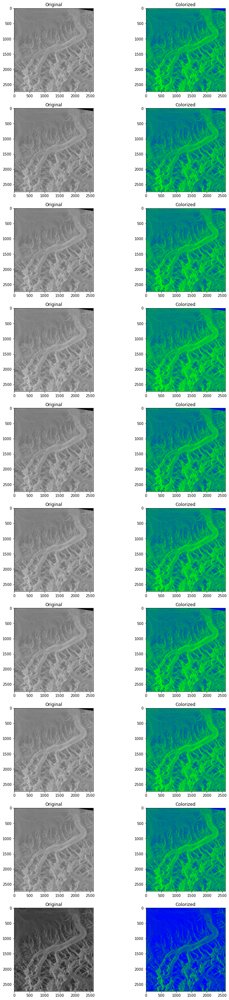

In [10]:
import cv2
import glob
import numpy as np
from matplotlib import pyplot as plt

def colorized(img):
    img = cv2.merge((img, img, img))
    red = np.zeros((1, 1, 3), np.uint8)
    red[:] = (0,0,255)
    green = np.zeros((1, 1, 3), np.uint8)
    green[:] = (0,255,0)
    lut = np.concatenate((red, green), axis=0)
    lut = cv2.resize(lut, (1,256), interpolation=cv2.INTER_CUBIC)
    result = cv2.LUT(img, lut)
    return result

f,ax=plt.subplots(len(glob.glob('images/*.png')),2,figsize=(12,50))
for i, filename in enumerate(glob.glob('images/*.png')):
    image = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
    ax[i,0].imshow(image,cmap='gray')
    ax[i,0].set_title('Original')
    image = colorized(image)
    ax[i,1].imshow(image)
    ax[i,1].set_title('Colorized')

<center>
    <br>
    <br>
    <h5 style = "color:green">--------------------------------------------------------------------------------------------</h5>
    <h1 style = "color:blue">Thank you so much</h1>
    <h5 style = "color:green">--------------------------------------------------------------------------------------------</h5>
    <br>
    <br>
<center>